# GPU Puzzles
- by [Sasha Rush](http://rush-nlp.com) - [srush_nlp](https://twitter.com/srush_nlp)

![](https://github.com/srush/GPU-Puzzles/raw/main/cuda.png)

GPU architectures are critical to machine learning, and seem to be
becoming even more important every day. However you can be an expert
in machine learning without ever touching GPU code. It is a bit
weird to be work always through abstraction. 

This notebook is an attempt teach beginner GPU programming in a
completely interactive fashion. Instead of providing text with
concepts, it throws you right into coding and building GPU
kernels. The exercises use NUMBA which directly maps Python
code to CUDA kernels. It looks like Python but is basically
identical to writing low-level CUDA code. 
In a few hours, I think you can go from basics to
understanding the real algorithms that power 99% of deep learning
today.

I recommend doing these in Colab, as it is easy to get started.  Be
sure to make your own copy, turn on GPU mode in the settings, and
then get to coding.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/srush/GPU-Puzzles/blob/main/GPU_puzzlers.ipynb)

(If you are into this style of puzzle, also check out my [Tensor
Puzzles](https://github.com/srush/Tensor-Puzzles) for PyTorch.)

In [1]:
# !pip install -qqq git+https://github.com/danoneata/chalk@srush-patch-1
# !wget -q https://github.com/srush/GPU-Puzzles/raw/main/robot.png https://github.com/srush/GPU-Puzzles/raw/main/lib.py

In [2]:
import numba
import numpy as np
import warnings
from lib import CudaProblem, Coord

In [3]:
warnings.filterwarnings(
    action="ignore", category=numba.NumbaPerformanceWarning, module="numba"
)

## Puzzle 1: Map

Implement a "kernel" (GPU function) that adds 10 to each position of vector `a`
and stores it in vector `out`.  You have 1 thread per position.

*Tip: Think of the function `call` as being run 1 time for each thread.
The only difference is that `cuda.threadIdx.x` changes each time.*

In [4]:
def map_spec(a):
    return a + 10

In [5]:
def map_test(cuda):
    def call(out, a) -> None:
        local_i = cuda.threadIdx.x
        # FILL ME IN (roughly 1 lines)
        out[local_i] = a[local_i] + 10

    return call

# Map
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             0 |             0 | 



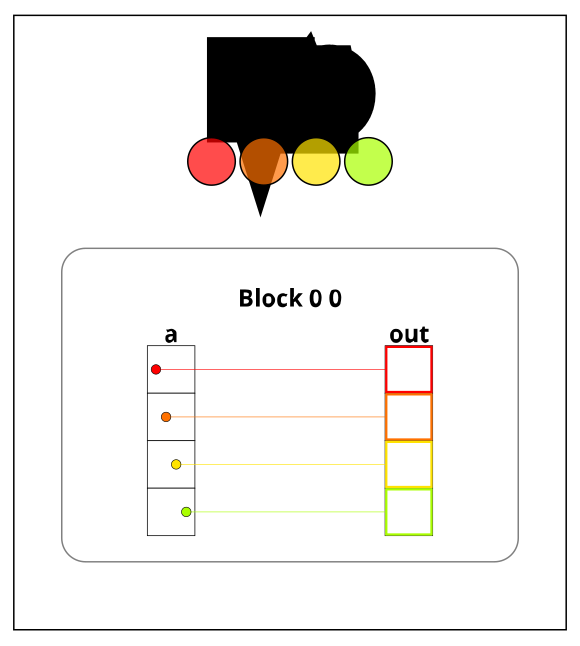

In [6]:
SIZE = 4
out = np.zeros((SIZE,))
a = np.arange(SIZE)
problem = CudaProblem(
    "Map", map_test, [a], out, threadsperblock=Coord(SIZE, 1), spec=map_spec
)
problem.show()

In [7]:
problem.check()

Passed Tests!


## Puzzle 2 - Zip

Implement a kernel that adds together each position of `a` and `b` and stores it in `out`.
You have 1 thread per position.

In [8]:
def zip_spec(a, b):
    return a + b

In [9]:
def zip_test(cuda):
    def call(out, a, b) -> None:
        local_i = cuda.threadIdx.x
        # FILL ME IN (roughly 1 lines)
        out[local_i] = a[local_i] + b[local_i]

    return call

# Zip
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             2 |             1 |             0 |             0 | 



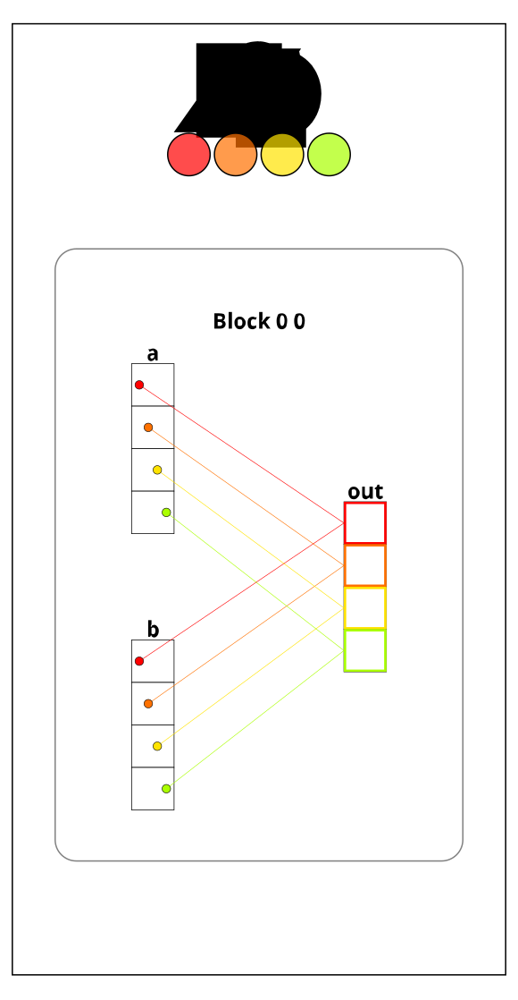

In [10]:
SIZE = 4
out = np.zeros((SIZE,))
a = np.arange(SIZE)
b = np.arange(SIZE)
problem = CudaProblem(
    "Zip", zip_test, [a, b], out, threadsperblock=Coord(SIZE, 1), spec=zip_spec
)
problem.show()

In [11]:
problem.check()

Passed Tests!


## Puzzle 3 - Guards

Implement a kernel that adds 10 to each position of `a` and stores it in `out`.
You have more threads than positions.

In [12]:
def map_guard_test(cuda):
    def call(out, a, size) -> None:
        local_i = cuda.threadIdx.x
        # FILL ME IN (roughly 2 lines)
        if local_i < size:
            out[local_i] = a[local_i] + 10

    return call

# Guard
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             0 |             0 | 



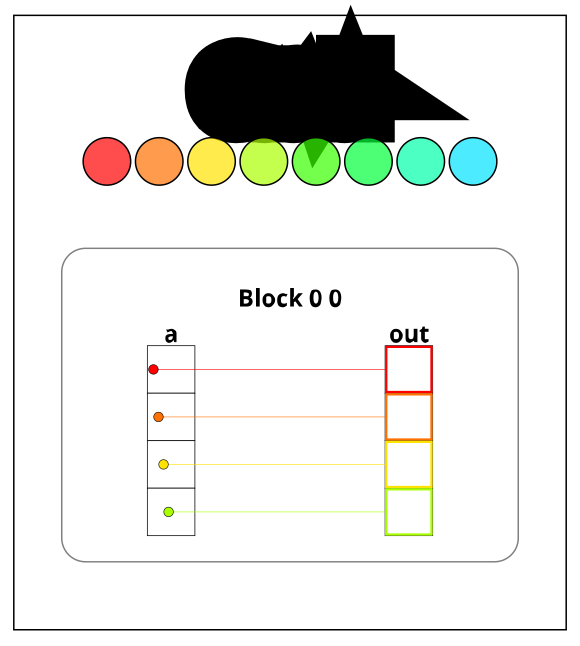

In [13]:
SIZE = 4
out = np.zeros((SIZE,))
a = np.arange(SIZE)
problem = CudaProblem(
    "Guard",
    map_guard_test,
    [a],
    out,
    [SIZE],
    threadsperblock=Coord(8, 1),
    spec=map_spec,
)
problem.show()

In [14]:
problem.check()

Passed Tests!


## Puzzle 4 - Map 2D

Implement a kernel that adds 10 to each position of `a` and stores it in `out`.
Input `a` is 2D and square. You have more threads than positions.

In [15]:
def map_2D_test(cuda):
    def call(out, a, size) -> None:
        local_i = cuda.threadIdx.x
        local_j = cuda.threadIdx.y
        # FILL ME IN (roughly 2 lines)
        if local_i < size and local_j < size:
            out[local_j, local_i] = a[local_j, local_i] + 10

    return call

# Map 2D
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             0 |             0 | 



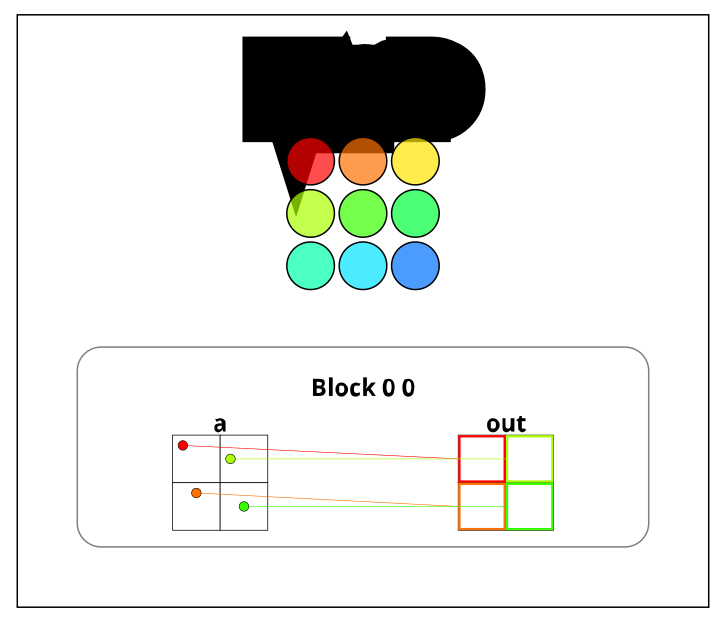

In [16]:
SIZE = 2
out = np.zeros((SIZE, SIZE))
a = np.arange(SIZE * SIZE).reshape((SIZE, SIZE))
problem = CudaProblem(
    "Map 2D", map_2D_test, [a], out, [SIZE], threadsperblock=Coord(3, 3), spec=map_spec
)
problem.show()

In [17]:
problem.check()

Passed Tests!


## Puzzle 5 - Broadcast

Implement a kernel that adds `a` and `b` and stores it in `out`.
Inputs `a` and `b` are vectors. You have more threads than positions.

In [18]:
def broadcast_test(cuda):
    def call(out, a, b, size) -> None:
        local_i = cuda.threadIdx.x
        local_j = cuda.threadIdx.y
        # FILL ME IN (roughly 2 lines)
        if local_i < size and local_j < size:
            out[local_j, local_i] = b[0, local_i] + a[local_j, 0]
    
    return call

# Broadcast
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             2 |             1 |             0 |             0 | 



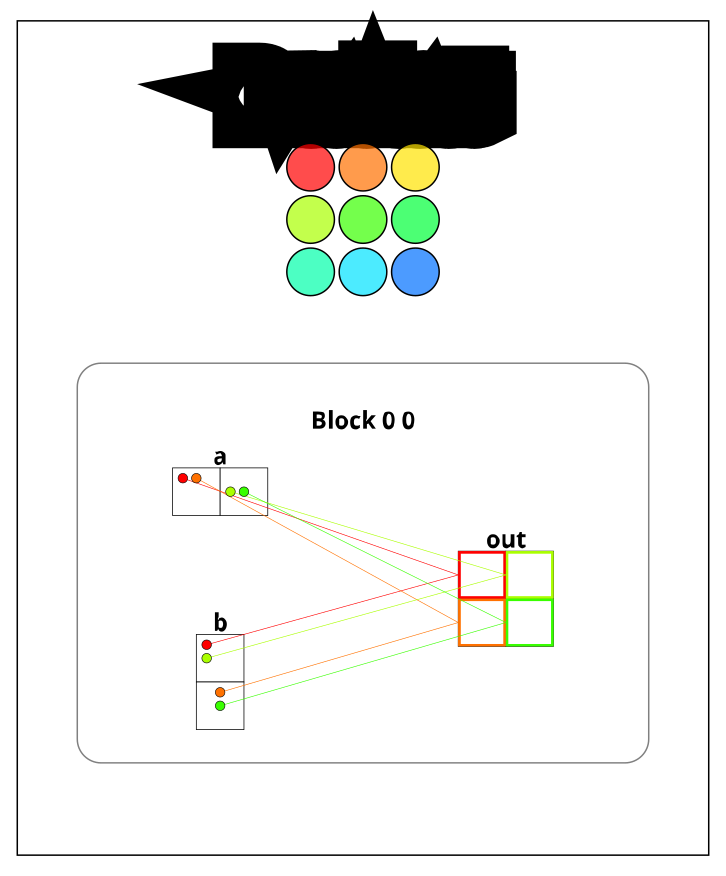

In [19]:
SIZE = 2
out = np.zeros((SIZE, SIZE))
a = np.arange(SIZE).reshape(SIZE, 1)
b = np.arange(SIZE).reshape(1, SIZE)
problem = CudaProblem(
    "Broadcast",
    broadcast_test,
    [a, b],
    out,
    [SIZE],
    threadsperblock=Coord(3, 3),
    spec=zip_spec,
)
problem.show()

In [20]:
problem.check()

Passed Tests!


## Puzzle 6 - Blocks

Implement a kernel that adds 10 to each position of `a` and stores it in `out`.
You have less threads per block than the size of `a`.

*Tip: A block is a group of threads. The number of threads per block is limited, but we can
have many different blocks. Variable `cuda.blockIdx` tells us what block we are in.*

In [21]:
def map_block_test(cuda):
    def call(out, a, size) -> None:
        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        # FILL ME IN (roughly 2 lines)
        # print(f'thread_id {i} = cuda.blockIdx.x {cuda.blockIdx.x} * cuda.blockDim.x {cuda.blockDim.x} + cuda.threadIdx.x {cuda.threadIdx.x}')
        if i < size:
            out[i] = a[i] + 10

    return call

# Blocks
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             0 |             0 | 



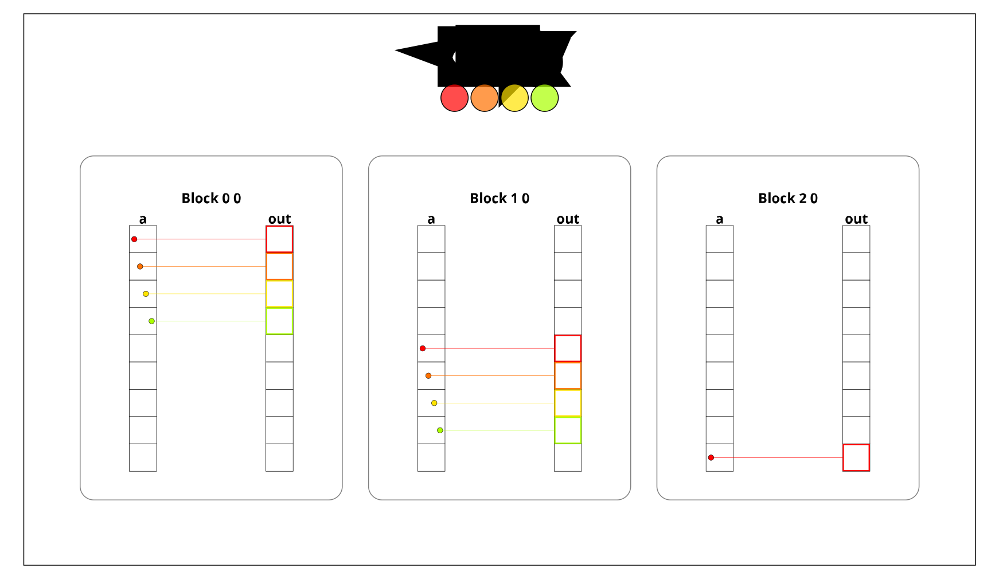

In [22]:
SIZE = 9
out = np.zeros((SIZE,))
a = np.arange(SIZE)
problem = CudaProblem(
    "Blocks",
    map_block_test,
    [a],
    out,
    [SIZE],
    threadsperblock=Coord(4, 1),
    blockspergrid=Coord(3, 1),
    spec=map_spec,
)
problem.show()

In [23]:
problem.check()

Passed Tests!


Puzzle 7 - Blocks 2D

Implement the same kernel in 2D.  You have less threads per block
than the size of `a` in both directions.

In [24]:
def map_block2D_test(cuda):
    def call(out, a, size) -> None:
        # i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        
        # FILL ME IN (roughly 4 lines)
        y = cuda.blockIdx.y * cuda.blockDim.y + cuda.threadIdx.y
        x = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        if y < size and x < size:
            out[y, x] = a[y, x] + 10

    return call

In [25]:
SIZE = 5
out = np.zeros((SIZE, SIZE))
a = np.ones((SIZE, SIZE))

In [26]:
problem = CudaProblem(
    "Blocks 2D",
    map_block2D_test,
    [a],
    out,
    [SIZE],
    threadsperblock=Coord(3, 3),
    blockspergrid=Coord(2, 2),
    spec=map_spec,
)
problem.show()

# Blocks 2D
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             0 |             0 | 



In [27]:
problem.check()

Passed Tests!


Puzzle 8 - Shared

Implement a kernel that adds 10 to each position of `a` and stores it in `out`.
You have less threads per block than the size of `a`.

*Tip: Each block can have a constant amount of shared memory that
only threads in that block can read and write to.
After writing you should use `cuda.syncthreads` to ensure that threads do not cross.*

(This example does not really need shared memory or syncthreads, but it is a demo.)

In [28]:
TPB = 4
def shared_test(cuda):
    def call(out, a, size) -> None:
        shared = cuda.shared.array(TPB, numba.float32)
        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        local_i = cuda.threadIdx.x

        if i < size:
            shared[local_i] = a[i]
            cuda.syncthreads()

        # FILL ME IN (roughly 2 lines)
        if i < size:
            out[i] = shared[local_i] + 10

    return call

# Shared
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             1 |             1 | 



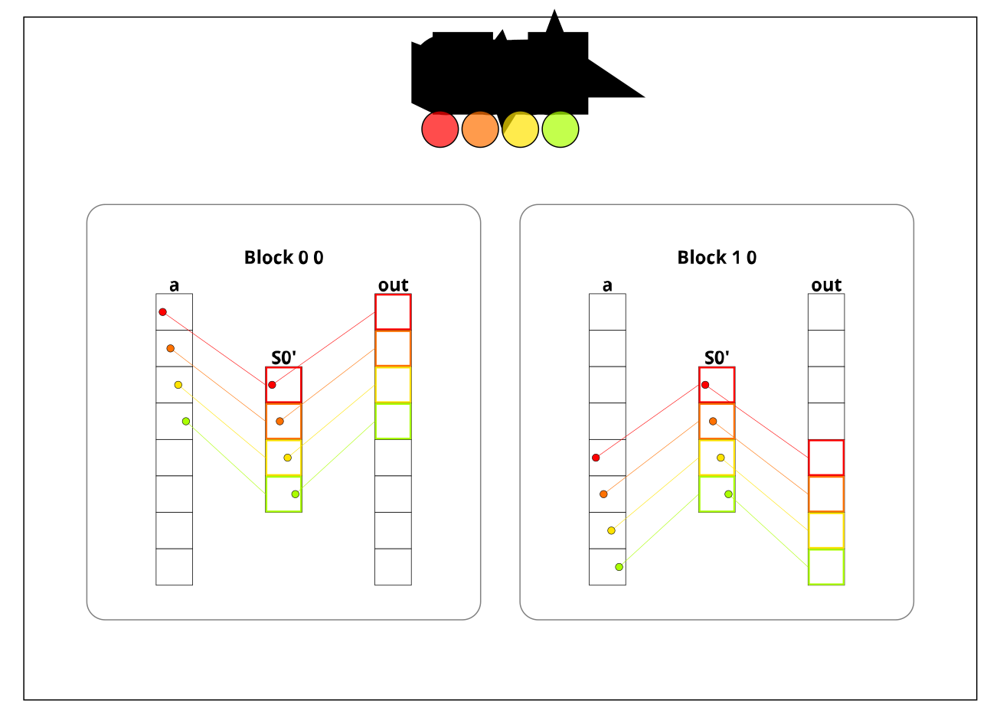

In [29]:
SIZE = 8
out = np.zeros(SIZE)
a = np.ones(SIZE)
problem = CudaProblem(
    "Shared",
    shared_test,
    [a],
    out,
    [SIZE],
    threadsperblock=Coord(TPB, 1),
    blockspergrid=Coord(2, 1),
    spec=map_spec,
)
problem.show()

In [30]:
problem.check()

Passed Tests!


## Puzzle 9 - Pooling

Implement a kernel that sums together the last 3 position of `a` and stores it in `out`.
You have 1 thread per position. You only need 1 global read and 1 global write per thread.

*Tip: Remember to be careful amount syncing.*

In [31]:
def pool_spec(a):
    out = np.zeros(*a.shape)
    for i in range(a.shape[0]):
        out[i] = a[max(i - 2, 0) : i + 1].sum()
    return out

In [32]:
TPB = 8
def pool_test(cuda):
    def call(out, a, size) -> None:
        shared = cuda.shared.array(TPB, numba.float32)
        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        local_i = cuda.threadIdx.x
        # FILL ME IN (roughly 8 lines)

        if i < size:  # could remove in this case
            shared[local_i] = a[i]
            cuda.syncthreads()

        if i < size:  # could remove in this case
            if i == 0: out[i] = shared[local_i]
            elif i == 1: out[i] = shared[local_i - 1] + shared[local_i]
            else: out[i] = shared[local_i - 2] + shared[local_i - 1] + shared[local_i]

    return call

# Pooling
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             3 |             1 | 



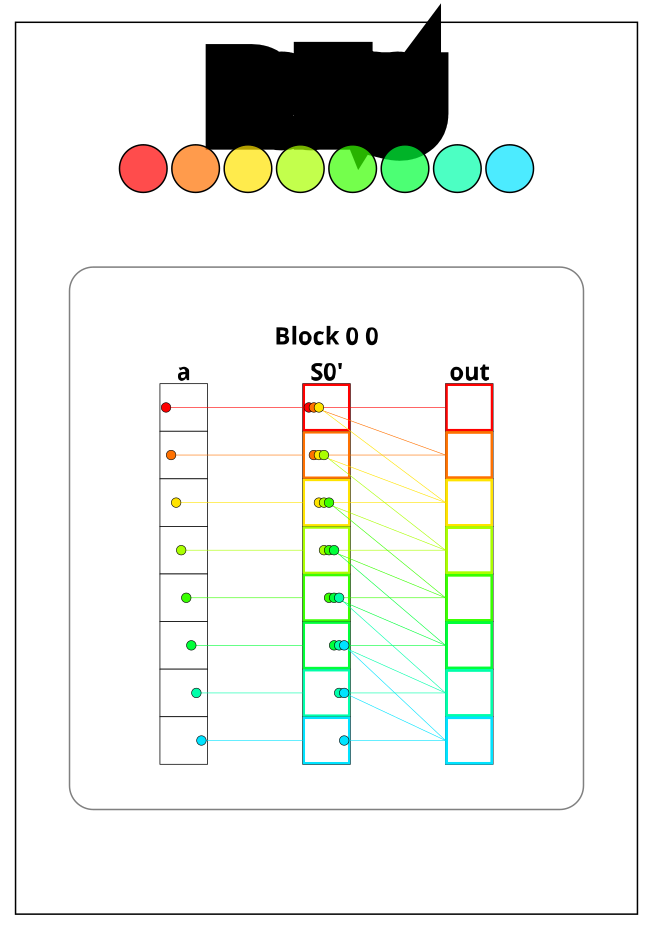

In [33]:
SIZE = 8
out = np.zeros(SIZE)
a = np.arange(SIZE)
problem = CudaProblem(
    "Pooling",
    pool_test,
    [a],
    out,
    [SIZE],
    threadsperblock=Coord(TPB, 1),
    blockspergrid=Coord(1, 1),
    spec=pool_spec,
)
problem.show()

In [34]:
problem.check()

Passed Tests!


## Puzzle 10 - Dot Product

Implement a kernel that computes the dot-product of `a` and `b` and stores it in `out`.
You have 1 thread per position. You only need 1 global read and 1 global write per thread.

In [35]:
def dot_spec(a, b):
    return a @ b

In [36]:
TPB = 8
def dot_test(cuda):
    def call(out, a, b, size) -> None:
        a_shared = cuda.shared.array(TPB, numba.float32)
        # b_shared = cuda.shared.array(TPB, numba.float32)

        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        local_i = cuda.threadIdx.x
        # FILL ME IN (roughly 9 lines)

        if i < size:
            a_shared[local_i] = a[i] * b[i]
            cuda.syncthreads()

        if i == 0:
            for j in range(1, size):
                a_shared[j] += a_shared[j - 1]
            out[0] = a_shared[size - 1]

    return call

In [37]:
SIZE = 8
out = np.zeros(1)
a = np.arange(SIZE)
b = np.arange(SIZE)
problem = CudaProblem(
    "Dot",
    dot_test,
    [a, b],
    out,
    [SIZE],
    threadsperblock=Coord(SIZE, 1),
    blockspergrid=Coord(1, 1),
    spec=dot_spec,
)
problem.show()

# Dot
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             2 |             1 |             1 |             1 | 



In [38]:
problem.check()

Passed Tests!


## Puzzle 11 - 1D Convolution

Implement a kernel that computes a 1D convolution between `a` and `b` and stores it in `out`.
You need to handle the general case. You only need 2 global reads and 1 global write per thread.

In [39]:
def conv_spec(a, b):
    out = np.zeros(*a.shape)
    len = b.shape[0]
    for i in range(a.shape[0]):
        out[i] = sum([a[i + j] * b[j] for j in range(len) if i + j < a.shape[0]])
    return out

In [40]:
MAX_CONV = 5
TPB = 8
TPB_MAX_CONV = TPB + MAX_CONV
def conv_test(cuda):
    def call(out, a, b, a_size, b_size) -> None:        
        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        local_i = cuda.threadIdx.x

        # FILL ME IN (roughly 17 lines)
        # 1. no optim
#         if i < a_size:
#             temp = 0
#             for j in range(i, i + b_size):
#                 if j >= a_size:
#                     break
#                 temp += a[j] * b[j - i]
#             out[i] = temp
        
        # 2. optim to 3 global read and 1 global write
        data_shared = cuda.shared.array(TPB_MAX_CONV, numba.float32)
        conv_shared = cuda.shared.array(MAX_CONV, numba.float32)
        
        if i < a_size:
            data_shared[local_i] = a[i]
            
            temp = i + cuda.blockDim.x
            while temp < TPB_MAX_CONV and temp < a_size:
                data_shared[temp] = a[temp]
                temp += cuda.blockDim.x
                
        if local_i < b_size:
            conv_shared[local_i] = b[local_i]
            
        cuda.syncthreads()
        
        if i < a_size:
            temp = 0
            for j in range(local_i, local_i + b_size):
                if j >= a_size:
                    break
                temp += data_shared[j] * conv_shared[j - local_i]
            out[i] = temp

    return call

Test 1

In [41]:
SIZE = 6
CONV = 3
out = np.zeros(SIZE)
a = np.arange(SIZE)
b = np.arange(CONV)
problem = CudaProblem(
    "1D Conv (Simple)",
    conv_test,
    [a, b],
    out,
    [SIZE, CONV],
    Coord(1, 1),
    Coord(TPB, 1),
    spec=conv_spec,
)
problem.show()

# 1D Conv (Simple)
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             2 |             1 |             6 |             2 | 



In [42]:
problem.check()

Passed Tests!


Test 2

In [43]:
out = np.zeros(15)
a = np.arange(15)
b = np.arange(4)
problem = CudaProblem(
    "1D Conv (Full)",
    conv_test,
    [a, b],
    out,
    [15, 4],
    Coord(2, 1),
    Coord(TPB, 1),
    spec=conv_spec,
)
problem.show()

# 1D Conv (Full)
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             3 |             1 |             8 |             3 | 



In [44]:
problem.check()

Passed Tests!


## Puzzle 12 - Prefix Sum

Implement a kernel that computes a sum over `a` and stores it in `out`.
If the size of `a` is greater than the block size, only store the sum of
each block.

We will do this, using the *parallel prefix sum* algorithm in shared memory.
That is each step of the algorithm should sum together half the remaining numbers.
Follow the top half of this diagram.

![](https://en.wikipedia.org/wiki/Prefix_sum#/media/File:Prefix_sum_16.svg)

In [45]:
TPB = 8
def sum_spec(a):
    out = np.zeros((a.shape[0] + TPB - 1) // TPB)
    for j, i in enumerate(range(0, a.shape[-1], TPB)):
        out[j] = a[i : i + TPB].sum()
    return out

In [46]:
def sum_test(cuda):
    def call(out, a, size: int) -> None:
        cache = cuda.shared.array(TPB, numba.float32)
        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        local_i = cuda.threadIdx.x
        
        # FILL ME IN (roughly 12 lines)
        if i < size:
            cache[local_i] = a[i]
        cuda.syncthreads()
        
        cnt = TPB / 2
        step = 2
        while cnt > 0:
            if local_i % step == 0:
                cache[local_i] += cache[local_i + step//2]
            
            cuda.syncthreads()
            cnt //= 2
            step *= 2
        
        if local_i == 0:
            out[cuda.blockIdx.x] = cache[0]
            
    return call

Test 1

In [47]:
SIZE = 8
out = np.zeros(1)
inp = np.arange(SIZE)
problem = CudaProblem(
    "Sum (Simple)",
    sum_test,
    [inp],
    out,
    [SIZE],
    Coord(1, 1),
    Coord(TPB, 1),
    spec=sum_spec,
)
problem.show()

# Sum (Simple)
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             7 |             4 | 



In [48]:
problem.check()

Passed Tests!


Test 2

In [49]:
SIZE = 15
out = np.zeros(2)
inp = np.arange(SIZE)
problem = CudaProblem(
    "Sum (Full)",
    sum_test,
    [inp],
    out,
    [SIZE],
    Coord(2, 1),
    Coord(TPB, 1),
    spec=sum_spec,
)
problem.show()

# Sum (Full)
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             7 |             4 | 



In [50]:
problem.check()

Passed Tests!


## Puzzle 13 - Axis Sum

Implement a kernel that computes a sum over each row of `a` and stores it in `out`.

In [51]:
TPB = 8
def sum_spec(a):
    out = np.zeros((a.shape[0], (a.shape[1] + TPB - 1) // TPB))
    for j, i in enumerate(range(0, a.shape[-1], TPB)):
        out[..., j] = a[..., i : i + TPB].sum(-1)
    return out

In [52]:
def axis_sum_test(cuda):
    def call(out, a, size: int) -> None:
        cache = cuda.shared.array(TPB, numba.float32)
        i = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        local_i = cuda.threadIdx.x
        batch = cuda.blockIdx.y
        
        # FILL ME IN (roughly 12 lines)
        if local_i < size:
            cache[local_i] = a[batch, local_i]
        cuda.syncthreads()
            
        cnt = TPB / 2
        step = 2
        while cnt > 0:
            if local_i % step == 0:
                cache[local_i] += cache[local_i + step//2]
            
            cuda.syncthreads()
            cnt //= 2
            step *= 2
        
        if local_i == 0:
            out[batch, 0] = cache[0]

    return call

In [53]:
BATCH = 4
SIZE = 6
out = np.zeros((BATCH, 1))
inp = np.arange(BATCH * SIZE).reshape((BATCH, SIZE))
problem = CudaProblem(
    "Axis Sum",
    axis_sum_test,
    [inp],
    out,
    [SIZE],
    Coord(1, BATCH),
    Coord(TPB, 1),
    spec=sum_spec,
)
problem.show()

# Axis Sum
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             1 |             1 |             7 |             4 | 



In [54]:
problem.check()

Passed Tests!


## Puzzle 14 - Matrix Multiply!

Implement a kernel that multiplies square matrices `a` and `b` and
stores it in `out`.

*Tip: The most efficient algorithm here will copy a block into
 shared memory before computing each of the individual row-column
 dot products. This is easy to do if the matrix fits in shared
 memory.  Do that case first. Then update your code so that compute
 a partial dot-product and then iteratively move the part that you
 copied into shared memory.* You should be able to do the hard case
 in 6 global reads.

In [55]:
def matmul_spec(a, b):
    return a @ b

In [56]:
TPB = 3
def mm_oneblock_test(cuda):
    def call(out, a, b, size: int) -> None:
        a_shared = cuda.shared.array((TPB, TPB), numba.float32)
        b_shared = cuda.shared.array((TPB, TPB), numba.float32)

        col = cuda.blockIdx.x * cuda.blockDim.x + cuda.threadIdx.x
        row = cuda.blockIdx.y * cuda.blockDim.y + cuda.threadIdx.y
        local_col = cuda.threadIdx.x
        local_row = cuda.threadIdx.y
        # FILL ME IN (roughly 14 lines)
        
        # 1. w/o shared memory
#         if col < size and row < size:
#             temp = 0
#             for _i in range(size):
#                 temp += a[row, _i] * b[_i, col]
#             out[row, col] = temp

        # 2. with shared memory
        temp = 0
        for sub in range(size//TPB + 1):
            r = row
            c = sub * TPB + local_col
            if r < size and c < size:
                a_shared[local_row, local_col] = a[r, c]
            
            r = sub * TPB + local_row;
            c = col
            if r < size and c < size:
                b_shared[local_row, local_col] = b[r, c]
                
            cuda.syncthreads()
            
            for k in range(TPB):
                if sub * TPB + k >= size: continue
                temp += a_shared[local_row, k] * b_shared[k, local_col]
            cuda.syncthreads()
        
        if row < size and col < size:
            out[row, col] = temp
            
    return call

Test 1

In [57]:
SIZE = 4
out = np.zeros((SIZE, SIZE))
inp1 = np.arange(SIZE * SIZE).reshape((SIZE, SIZE))
inp2 = np.arange(SIZE * SIZE).reshape((SIZE, SIZE)).T

In [58]:
problem = CudaProblem(
    "Matmul (Simple)",
    mm_oneblock_test,
    [inp1, inp2],
    out,
    [SIZE],
    Coord(2, 2),
    Coord(TPB, TPB),
    spec=matmul_spec,
)
problem.show(sparse=True)

# Matmul (Simple)
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             4 |             1 |             8 |             4 | 



In [59]:
problem.check()

Passed Tests!


In [60]:
# Test 2
SIZE = 8
out = np.zeros((SIZE, SIZE))
inp1 = np.arange(SIZE * SIZE).reshape((SIZE, SIZE))
inp2 = np.arange(SIZE * SIZE).reshape((SIZE, SIZE)).T

In [61]:
problem = CudaProblem(
    "Matmul (Full)",
    mm_oneblock_test,
    [inp1, inp2],
    out,
    [SIZE],
    Coord(3, 3),
    Coord(TPB, TPB),
    spec=matmul_spec,
)
problem.show(sparse=True)

# Matmul (Full)
 
   Score (Max Per Thread):
   |  Global Reads | Global Writes |  Shared Reads | Shared Writes |
   |             6 |             1 |            16 |             6 | 



In [62]:
problem.check()

Passed Tests!
